# 3D Failure Detection with YOLO v12
Dataset: https://universe.roboflow.com/additive-manufacturing-qa/3dprinting/dataset/6#

In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 23.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 66.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 57.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 40.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 102.1 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling

In [21]:
from google.colab import userdata
roboflowAPIKEY = userdata.get('roboflowAPIKEY')

In [2]:
#load data
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key=roboflowAPIKEY)
project = rf.workspace("additive-manufacturing-qa").project("3dprinting")
version = project.version(6)
dataset = version.download("yolov12")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.3/85.3 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 21.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 115.0 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.11.0.86
    Uninstalling opencv-python-headless-4.11.0.86:
      Successfully uninstalled opencv-python-headless-4.11.0.86
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to 3Dprinting-6 in yolov12:: 100%|██████████| 1396/1396 [00:00<00:00, 10317.15it/s]


In [6]:
#load other useful libaries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import cv2
from google.colab.patches import cv2_imshow
import yaml

In [9]:
#define paths
X_train_path = '/content/3Dprinting-6/train/images'
Y_train_path = '/content/3Dprinting-6/train/labels'

X_test_path = '/content/3Dprinting-6/test/images'
Y_test_path = '/content/3Dprinting-6/test/labels'

X_valid_path = '/content/3Dprinting-6/valid/images'
Y_valid_path = '/content/3Dprinting-6/valid/labels'

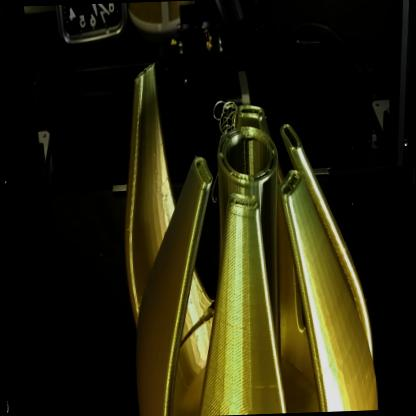

Capture-d-ecran--285-



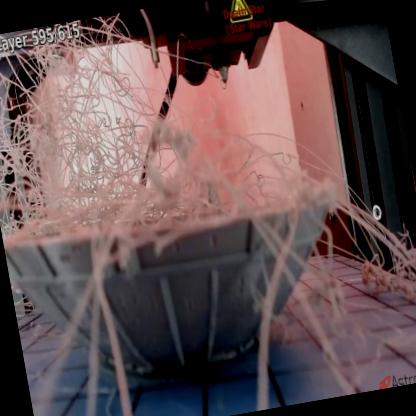

Capture-d-ecran--571-



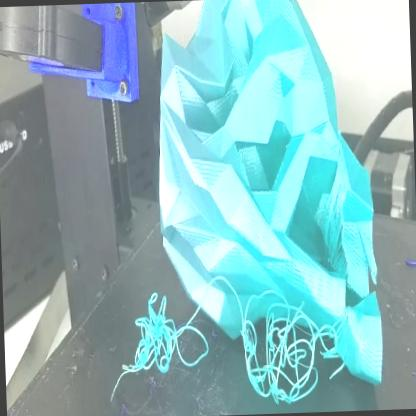

failed-print-head4er



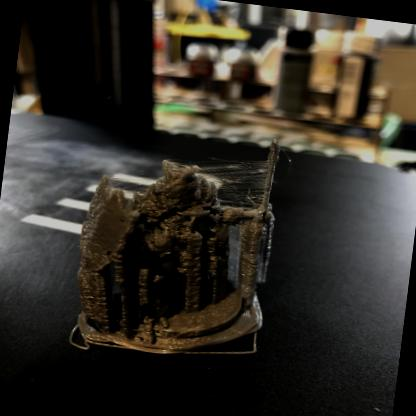

prmjf1yvlt811



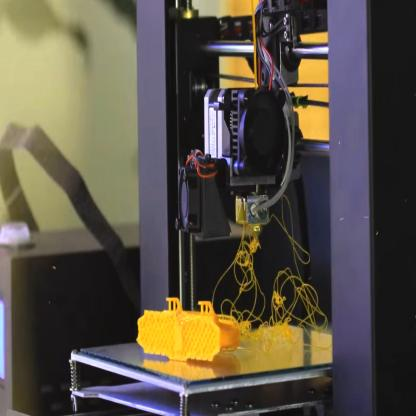

Capture-d-ecran--515-



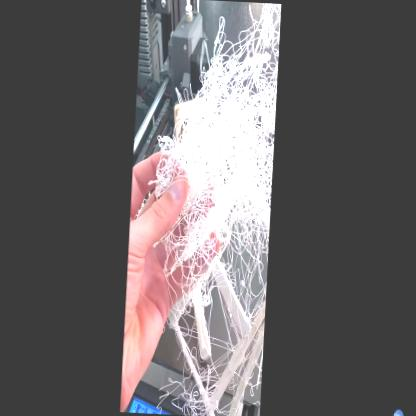

Capture-d-ecran--629-



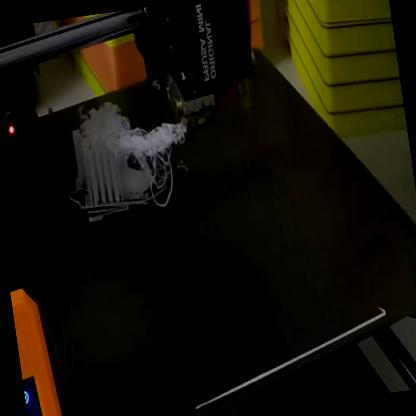

Capture-d-ecran--597-



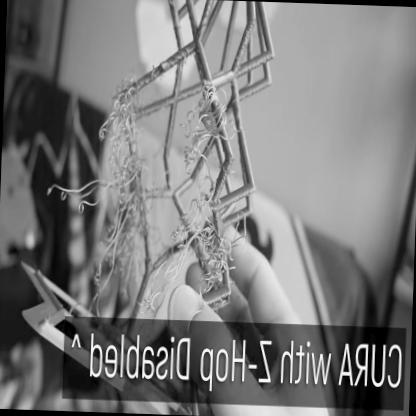

Capture-d-ecran--644-



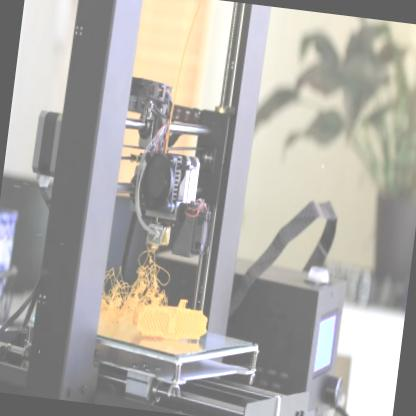

Capture-d-ecran--536-



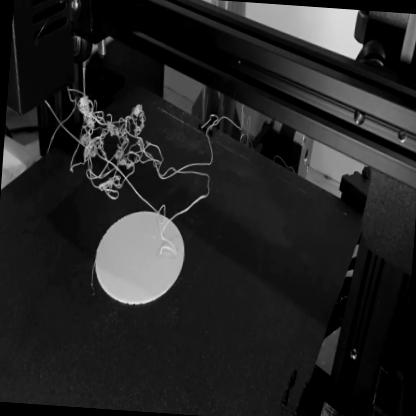

Capture-d-ecran--423-



In [10]:
#observe data
for file in os.listdir(X_train_path)[:10]:
    img_path= os.path.join(X_train_path, file)

    label_path= os.path.join(Y_train_path, file.split(".")[0])

    label= label_path.split("/")[-1]
    label= label.split("_")[0]

    img= cv2.imread(img_path)
    cv2_imshow(img)

    print(f"{label}\n")

In [12]:
#run the model
! yolo task= detect mode= train model= yolo12n.pt data= "/content/3Dprinting-6/data.yaml" imgsz= 640 batch= 16 epochs= 100 patience= 20 amp= True

Ultralytics 8.3.134 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/3Dprinting-6/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo12n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=20, perspective=0.0, plots=True, pose=12.0, pretra

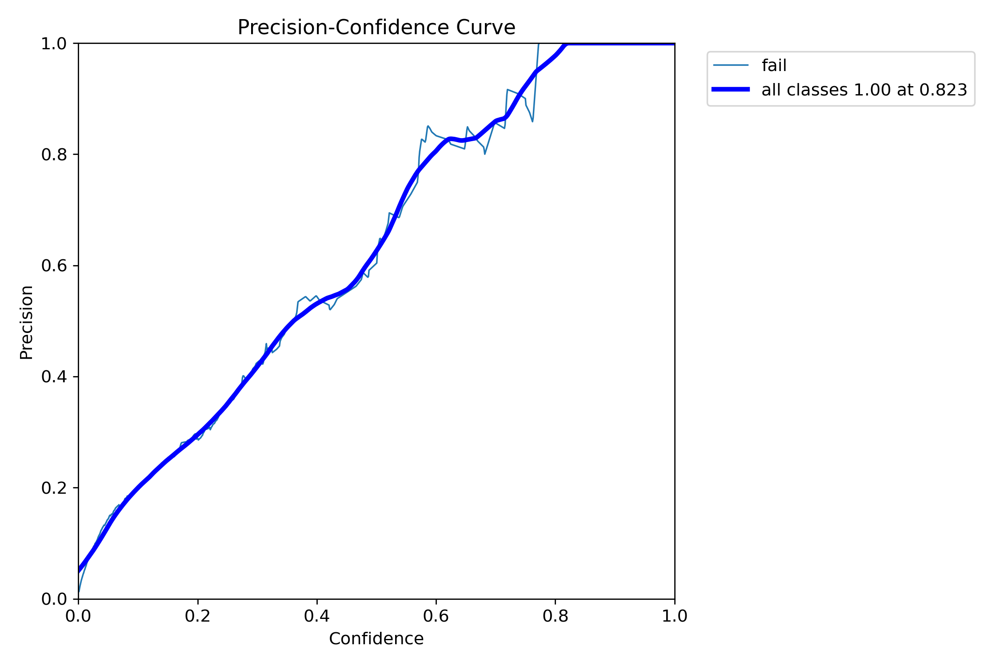

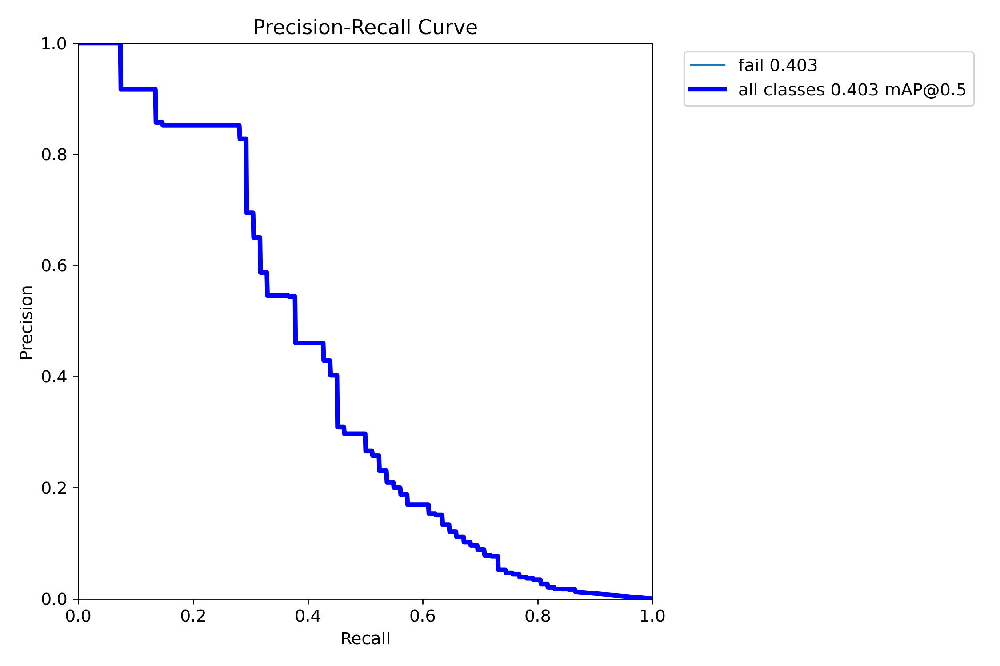

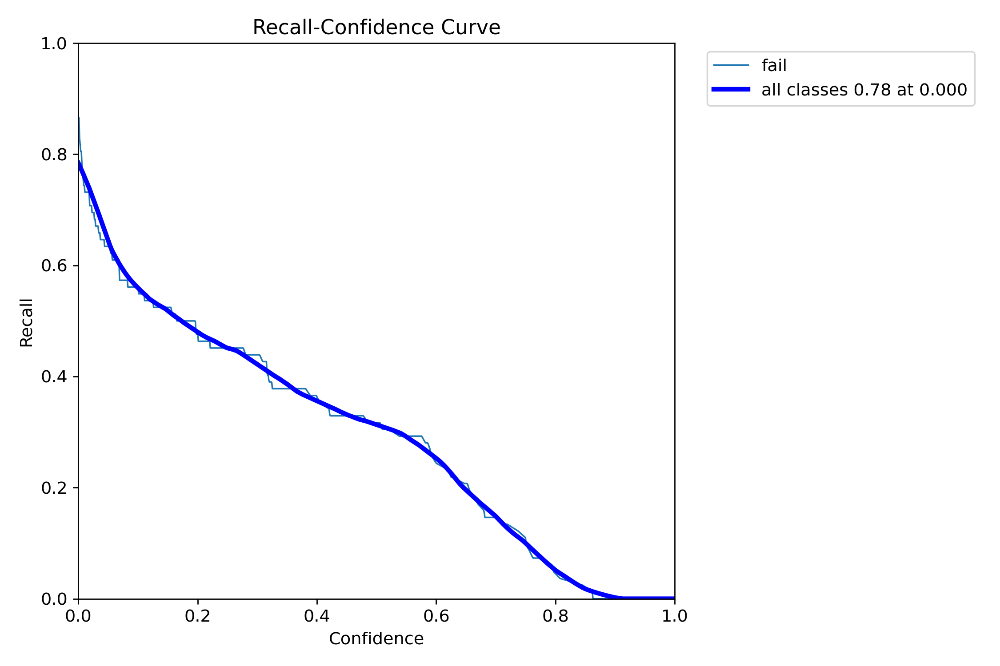

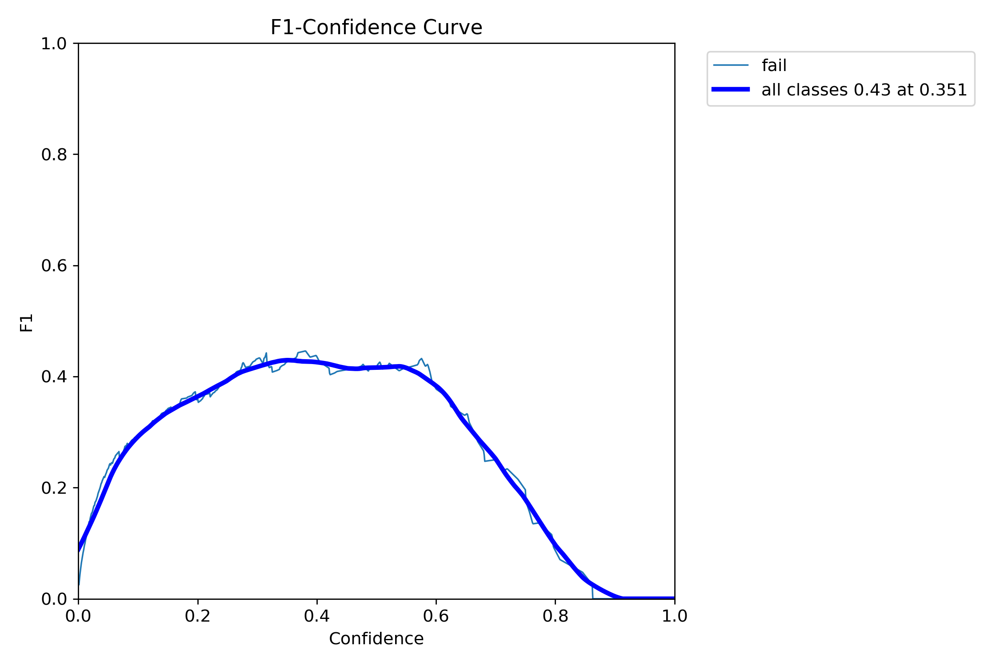

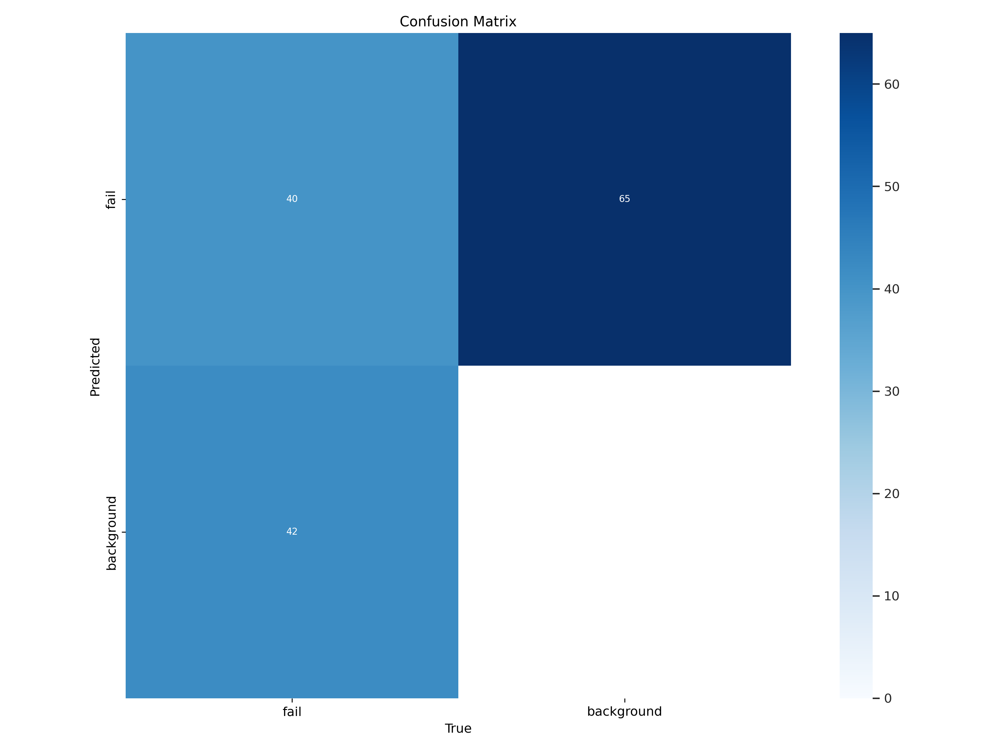

In [17]:
# p curve, pr curve, r curve, f1 curve, confussion matrix
files= ['P_curve.png', 'PR_curve.png', 'R_curve.png', 'F1_curve.png', 'confusion_matrix.png']

for file in files:
    img= cv2.imread(os.path.join('/content/runs/detect/train2/', file))
    cv2_imshow(img)

In [18]:
results_csv= pd.read_csv("/content/runs/detect/train2/results.csv")
results_csv.head()

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,16.6073,2.08609,3.23345,2.01680,0.00389,0.68293,0.06702,0.01450,2.26871,3.81370,2.90388,0.000650,0.000650,0.000650
1,2,30.7299,2.18068,2.97004,2.07928,0.00642,0.02439,0.00168,0.00049,3.40703,5.90068,4.77246,0.001303,0.001303,0.001303
2,3,44.3179,2.28323,2.89506,2.15083,0.33333,0.01220,0.00665,0.00142,NaN,NaN,NaN,0.001944,0.001944,0.001944
3,4,58.5049,2.25901,2.77805,2.15901,0.03847,0.08537,0.01298,0.00444,NaN,NaN,NaN,0.001941,0.001941,0.001941
4,5,72.0203,2.18124,2.62401,2.10095,0.00545,0.01220,0.00197,0.00057,NaN,NaN,NaN,0.001921,0.001921,0.001921


In [26]:
# cli
!yolo task= detect mode= predict model= /content/runs/detect/train2/weights/best.pt source= /content/3Dprinting-6/valid/images conf= 0.3

Ultralytics 8.3.134 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12n summary (fused): 159 layers, 2,556,923 parameters, 0 gradients, 6.3 GFLOPs

image 1/48 /content/3Dprinting-6/valid/images/1588688033773-29dec04f-0c51-40b3-9c1f-c6df4bcb832e-image_jpg.rf.2e4b634d4f6ef519c9e3be8e9c2a71fe.jpg: 640x640 3 fails, 30.9ms
image 2/48 /content/3Dprinting-6/valid/images/1e0889f0d3cb71fe1a1dc15a23bcda8cf78d4241-jpg_jpg.rf.53d1abebb718f166272a5821025496aa.jpg: 640x640 1 fail, 14.7ms
image 3/48 /content/3Dprinting-6/valid/images/1lzqnbykylm01_jpg.rf.a9481755f3d35cae83abe48a3409ef21.jpg: 640x640 (no detections), 13.9ms
image 4/48 /content/3Dprinting-6/valid/images/2xuomxwoxuk11_jpg.rf.9a1b04e8aecf3a86a8201de214ddecad.jpg: 640x640 1 fail, 14.0ms
image 5/48 /content/3Dprinting-6/valid/images/3d-printing-mistakes-problems_jpg.rf.2443ba36848f5d3e0634a875cd35e37b.jpg: 640x640 2 fails, 15.0ms
image 6/48 /content/3Dprinting-6/valid/images/92F10134-9D62-4037-B072-1412AC6EB9C9_jpg.rf.7

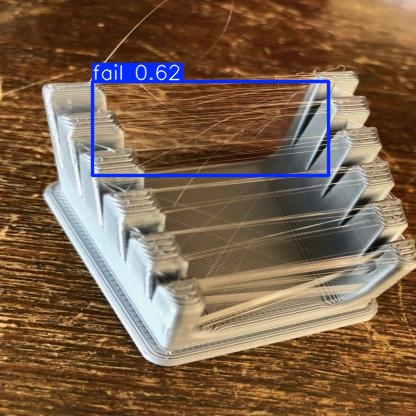

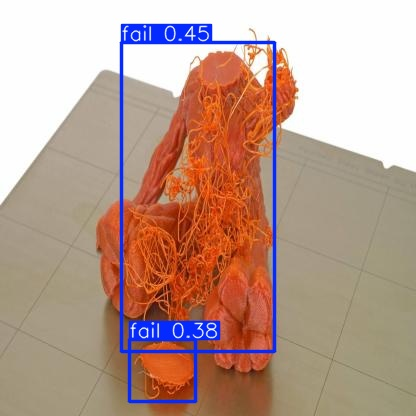

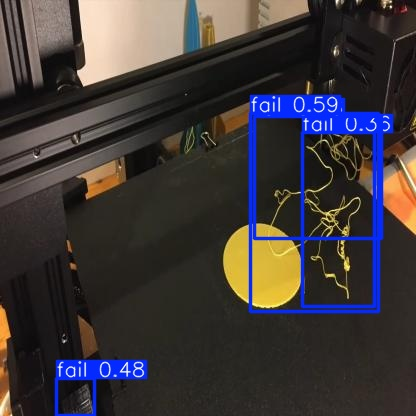

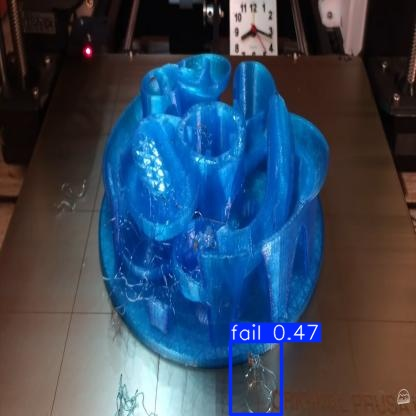

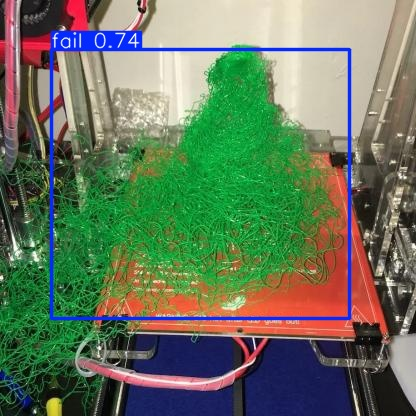

...

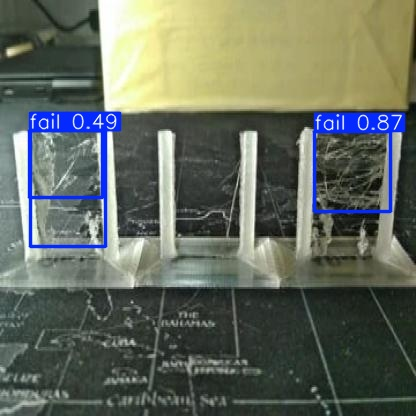

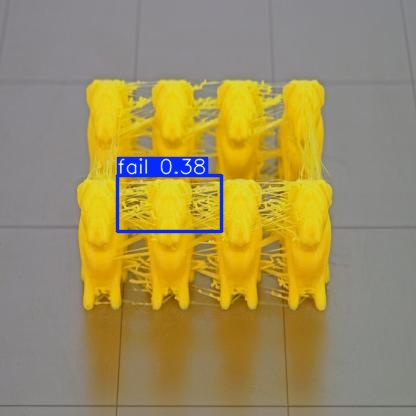

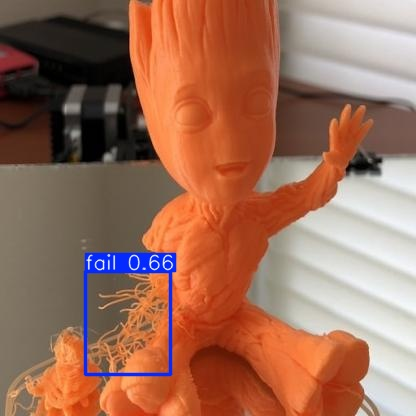

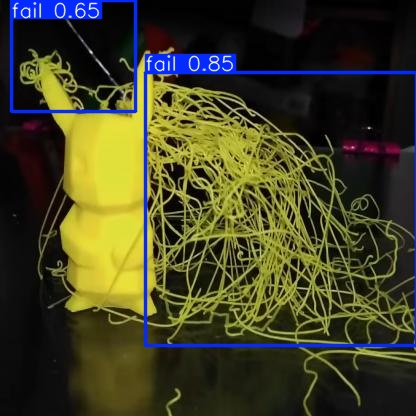

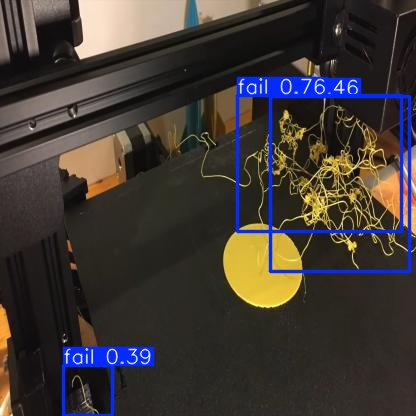

In [27]:
preds_dir = "/content/runs/detect/predict2"
for file in os.listdir(preds_dir):
    file_path = os.path.join(preds_dir, file)

    if file.lower().endswith((".png", ".jpg", ".jpeg", ".bmp")):
        # Process images
        img = cv2.imread(file_path)
        if img is not None:
            cv2_imshow(img)
            print("\n")
        else:
            print(f"Failed to load image: {file}")

    elif file.lower().endswith(".avi"):
        # Process videos
        cap = cv2.VideoCapture(file_path)
        if not cap.isOpened():
            print(f"Failed to open video: {file}")
            continue

        print(f"Playing video: {file}")
        while cap.isOpened():
            ret, frame = cap.read()
            if not ret:
                break  # End of video

            cv2_imshow(frame)  # Display video frames
        cap.release()

        print("\n")